## important imports

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
pd.set_option('display.max_columns', 500)
plt.style.use('ggplot')
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)

from IPython.display import display, HTML

pd.options.display.max_columns = None


In [126]:
df = pd.read_csv (r'reddit_data_final.csv',index_col='created',parse_dates=True)

display(df.head(5))
display(df.shape)
display(df.columns)

,Unnamed: 0,sub_id,title,url,author,score,numComms,permalink,flair,stickied,pinned,over_18,selftext,spoiler,num_crossposts,is_video
created,,,,,,,,,,,,,,,,
2018-01-11 00:51:51,0,7phya4,"Crocodile in water tiger on land: Humans, Gays...",https://imgur.com/a/UGJm7,IBRAHIM_MODI,1,0,/r/india/comments/7phya4/crocodile_in_water_ti...,Politics,False,False,False,NaN,False,0,False
2018-01-11 00:54:51,1,7phz3r,"Dr. James Melius, Advocate for Workers’ Health...",https://www.nytimes.com/2018/01/10/obituaries/...,modi-modi-modi,1,0,/r/india/comments/7phz3r/dr_james_melius_advoc...,NaN,False,False,False,NaN,False,0,False
2018-01-11 00:56:43,2,7phzla,Samsung Galaxy S9 Will launch Next Month At MW...,http://techcresendo.com/2018/01/11/samsung-gal...,sundi93,1,0,/r/india/comments/7phzla/samsung_galaxy_s9_wil...,Science/Technology,False,False,False,NaN,False,0,False
2018-01-11 00:57:23,3,7phzre,"Exposed: Kerala madrasas teaching Wahabism, Sa...",http://m.indiatoday.in/lite/story/kerala-wahha...,Bega_zeke,7,2,/r/india/comments/7phzre/exposed_kerala_madras...,Non-Political,False,False,False,NaN,False,0,False
2018-01-11 01:01:05,4,7pi0qt,How can we start a small service provider firm...,https://www.reddit.com/r/india/comments/7pi0qt...,planet_jupiter,1,0,/r/india/comments/7pi0qt/how_can_we_start_a_sm...,AskIndia,False,False,False,What are the steps in order to setup a small b...,False,0,False


(416406, 16)

Index(['Unnamed: 0', 'sub_id', 'title', 'url', 'author', 'score', 'numComms',
       'permalink', 'flair', 'stickied', 'pinned', 'over_18', 'selftext',
       'spoiler', 'num_crossposts', 'is_video'],
      dtype='object')

In [127]:
print (df.dtypes)
print (" ")
print (df.describe())

Unnamed: 0         int64
sub_id            object
title             object
url               object
author            object
score              int64
numComms           int64
permalink         object
flair             object
stickied            bool
pinned              bool
over_18             bool
selftext          object
spoiler             bool
num_crossposts     int64
is_video            bool
dtype: object
 
          Unnamed: 0          score       numComms  num_crossposts
count  416406.000000  416406.000000  416406.000000   416406.000000
mean   208202.500000      16.448927       8.702548        0.004971
std    120206.202434     116.345586      66.919304        0.109620
min         0.000000       0.000000       0.000000        0.000000
25%    104101.250000       1.000000       0.000000        0.000000
50%    208202.500000       1.000000       0.000000        0.000000
75%    312303.750000       2.000000       4.000000        0.000000
max    416405.000000   19575.000000   11706.0000

In [128]:
print('number of duplicates')
print(len(df)-len(df.drop_duplicates()))
print('')
print('columnwise')
print('')
print(len(df) - df.nunique())

number of duplicates
0

columnwise

Unnamed: 0             0
sub_id                 0
title              20259
url                 9634
author            346133
score             414831
numComms          415505
permalink              0
flair             416193
stickied          416404
pinned            416405
over_18           416404
selftext          361886
spoiler           416404
num_crossposts    416391
is_video          416404
dtype: int64


In [129]:
unique=df.flair.unique()
print(unique.shape)
for i in unique:
    total=total+list(df.flair).count(i)
    print(i, list(df.flair).count(i))
    


(214,)
Politics 60077
nan 195253
Science/Technology 10081
Non-Political 58610
AskIndia 32703
Unverified Content. 321
Policy 143
Not Original Title. 538
Policy/Economy 9559
Repost; 347
Demonetization 2295
Business/Finance 13061
Twitter 47
Not in English. 2977
Personal Info. 83
Sports 4079
Scheduled 1260
Not about India. 378
All CAPS. 1334
Low-effort Self Post. 188
Unverified 56
Meta. 121
Food 2609
Personal Info. Twitter 1
[R]eddiquette 5467
Not about India. Not Original Title. 24
Not Original Title. Repost; 13
Old. 28
Self-promotion. 21
Casual 40
Personal Info. Unverified Content. 9
Low-effort self-post. 926
NSFW 1
Unverified AMA 1
Custom; Informed OP 57
Not Original Title. TIL Rule Violation. 1
TIL Rule Violation. 60
No spoilers in title  1
It’s 2018 ... 1
Not Original Title. Unverified Content. 17
Askindia 51
r/India found its new toy! 1
Not in English. Unverified Content. 12
Not in English. Not Original Title. 8
Meta. Custom; Informed OP 4
Witch-hunt. Meta. 1
Misleading 53
Low-effort

In [130]:
df['Year']=df.index.year
df = df.assign(dummy_calc=1)
Yearwise=df.groupby(by=('Year')).sum()
plt.figure(figsize=(14,10))
display(Yearwise)


trace1 = go.Scatter(x=Yearwise.index,
                    y=Yearwise.dummy_calc,
                    name = "plotly example",
                    line = dict(color = 'blue'),
                    opacity = 0.4)

layout = dict(title='plotly example',)

fig = dict(data=[trace1], layout=layout)
iplot(fig)

,Unnamed: 0,score,numComms,stickied,pinned,over_18,spoiler,num_crossposts,is_video,dummy_calc
Year,,,,,,,,,,
2018,16478476570,3070635,1198709,79.0,0.0,565.0,268.0,1992,918.0,181541
2019,51061225176,3670005,1707269,1.0,0.0,534.0,346.0,5,1976.0,185991
2020,19157068469,108792,717815,6.0,0.0,233.0,132.0,73,1334.0,48874


<Figure size 1008x720 with 0 Axes>

## Displaying distribution of posts monthly 

In [132]:
df_2018=df.loc[df['Year'] == 2018]
display(df_2018.shape)
df_2019=df.loc[df['Year'] == 2019]
display(df_2019.shape)
df_2020=df.loc[df['Year'] == 2020]
display(df_2020.shape)

(181541, 18)

(185991, 18)

(48874, 18)

In [133]:
df_2018['month']=df_2018.index.month
df_2018 = df_2018.assign(dummy_calc=1)
month_2018=df_2018.groupby(by=('month')).sum()
plt.figure(figsize=(14,10))
display(month_2018)


trace1 = go.Scatter(x=month_2018.index,
                    y=month_2018.dummy_calc,
                    name = "plotly example",
                    line = dict(color = 'blue'),
                    opacity = 0.4)

layout = dict(title='Month wise dist. of posts 2018',)

fig = dict(data=[trace1], layout=layout)
iplot(fig)

/home/utsav/.local/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,Unnamed: 0,score,numComms,stickied,pinned,over_18,spoiler,num_crossposts,is_video,Year,dummy_calc
month,,,,,,,,,,,
1,65179653,205153,72136,14.0,0.0,40.0,10.0,75,35.0,23041524,11418
2,275725563,270253,98220,20.0,0.0,51.0,16.0,108,68.0,29652492,14694
3,575592675,376678,103014,24.0,0.0,65.0,13.0,225,47.0,33704636,16702
4,831946654,448466,107932,20.0,0.0,49.0,22.0,212,64.0,32935778,16321
5,916602983,397183,121488,1.0,0.0,44.0,16.0,226,73.0,27995714,13873
6,1084775772,411005,107016,0.0,0.0,52.0,23.0,243,102.0,27430674,13593
7,1411304301,344885,103477,0.0,0.0,57.0,30.0,285,92.0,30265964,14998
8,1719866415,296630,93391,0.0,0.0,40.0,26.0,342,116.0,31708834,15713
9,1902232975,270893,84631,0.0,0.0,33.0,30.0,276,82.0,30728086,15227


<Figure size 1008x720 with 0 Axes>

In [134]:
df_2019['month']=df_2019.index.month
df_2019 = df_2019.assign(dummy_calc=1)
month_2019=df_2019.groupby(by=('month')).sum()
plt.figure(figsize=(14,10))
display(month_2019)


trace1 = go.Scatter(x=month_2019.index,
                    y=month_2019.dummy_calc,
                    name = "plotly example",
                    line = dict(color = 'blue'),
                    opacity = 0.4)

layout = dict(title='Month wise dist. of posts 2019',)

fig = dict(data=[trace1], layout=layout)
iplot(fig)

/home/utsav/.local/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,Unnamed: 0,score,numComms,stickied,pinned,over_18,spoiler,num_crossposts,is_video,Year,dummy_calc
month,,,,,,,,,,,
1,2832462980,15010,97693,0.0,0.0,31.0,20.0,0,91.0,30252696,14984
2,3159258486,206697,126629,0.0,0.0,47.0,30.0,0,110.0,31227873,15467
3,3969337999,453768,140340,0.0,0.0,57.0,34.0,0,122.0,36267297,17963
4,3962421785,420091,116643,0.0,0.0,32.0,38.0,0,137.0,33575970,16630
5,4347771558,446336,134327,0.0,0.0,54.0,54.0,0,148.0,34409817,17043
6,4312771408,434270,106548,0.0,0.0,45.0,22.0,2,175.0,32063739,15881
7,4335172569,399939,100385,0.0,0.0,38.0,18.0,1,156.0,30490938,15102
8,4595148665,395877,131111,0.0,0.0,35.0,18.0,0,167.0,30698895,15205
9,4606206633,396570,160388,0.0,0.0,35.0,19.0,1,171.0,29330013,14527


<Figure size 1008x720 with 0 Axes>

In [135]:
df_2020['month']=df_2020.index.month
df_2020 = df_2020.assign(dummy_calc=1)
month_2020=df_2020.groupby(by=('month')).sum()
plt.figure(figsize=(14,10))
display(month_2020)


trace1 = go.Scatter(x=month_2020.index,
                    y=month_2020.dummy_calc,
                    name = "plotly example",
                    line = dict(color = 'blue'),
                    opacity = 0.4)

layout = dict(title='Month wise dist. of posts 2020',)

fig = dict(data=[trace1], layout=layout)
iplot(fig)

/home/utsav/.local/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,Unnamed: 0,score,numComms,stickied,pinned,over_18,spoiler,num_crossposts,is_video,Year,dummy_calc
month,,,,,,,,,,,
1,5373219510,69169,201539,1.0,0.0,76.0,29.0,59,278.0,28966800,14340
2,4654064129,12122,174864,0.0,0.0,64.0,32.0,0,215.0,24237980,11999
3,6647710216,17831,258085,4.0,0.0,71.0,50.0,4,625.0,33392620,16531
4,2482074614,9670,83327,1.0,0.0,22.0,21.0,10,216.0,12128080,6004


<Figure size 1008x720 with 0 Axes>

In [136]:
df['day']=df.index.day
df = df.assign(dummy_calc=1)
day=df.groupby(by=('day')).sum()
plt.figure(figsize=(14,10))
display(day)


trace1 = go.Scatter(x=day.index,
                    y=day.dummy_calc,
                    name = "plotly example",
                    line = dict(color = 'blue'),
                    opacity = 0.4)

layout = dict(title='daily distribution of posts',)

fig = dict(data=[trace1], layout=layout)
iplot(fig)

,Unnamed: 0,score,numComms,stickied,pinned,over_18,spoiler,num_crossposts,is_video,Year,dummy_calc
day,,,,,,,,,,,
1,2874221521,207940,122185,2.0,0.0,50.0,24.0,42,143.0,27588097,13666
2,2791741825,222214,109573,4.0,0.0,49.0,25.0,61,130.0,26479893,13117
3,2877088573,253299,121413,1.0,0.0,48.0,19.0,76,188.0,27071338,13410
4,2838860833,236131,124297,5.0,0.0,38.0,21.0,73,119.0,26944030,13347
5,3011941180,222304,127892,1.0,0.0,34.0,25.0,66,155.0,28088874,13914
6,2974000229,216049,122735,2.0,0.0,36.0,24.0,48,121.0,28058480,13899
7,2912155041,223353,119637,1.0,0.0,54.0,30.0,74,126.0,27515461,13630
8,2721583079,206861,125635,2.0,0.0,36.0,16.0,43,122.0,26223119,12990
9,2784269672,212925,115096,3.0,0.0,29.0,17.0,83,127.0,26481564,13118


<Figure size 1008x720 with 0 Axes>

In [141]:
dfn=df

In [142]:
dfn.shape

(416406, 19)

In [145]:
dfn = dfn.groupby('flair').filter(lambda x: len(x) > 1000)

In [146]:
dfn.shape

(216401, 19)

In [147]:
unique=dfn.flair.unique()
print(unique.shape)

(16,)


## Now we have only 16 flairs after filtering lets look at them

In [148]:
total=0
for i in unique:
    total=total+list(dfn.flair).count(i)
    print(i, list(dfn.flair).count(i))
    
total

Politics 60077
Science/Technology 10081
Non-Political 58610
AskIndia 32703
Policy/Economy 9559
Demonetization 2295
Business/Finance 13061
Not in English. 2977
Sports 4079
Scheduled 1260
All CAPS. 1334
Food 2609
[R]eddiquette 5467
Photography 4552
CAA-NRC 1070
Coronavirus 6667


216401

## We will not include 'not in english', 'scheduled', 'ALL CAPS' in our dataset. We will also merge CAA-NRC in politics flair. Similarly merge Demonetization in Policy/Economy flair.

In [160]:
dfn = dfn[dfn.flair != 'Not in English.']
dfn = dfn[dfn.flair != 'Scheduled']
dfn = dfn[dfn.flair != 'All CAPS.']

In [164]:
unique=dfn.flair.unique()
print(unique.shape)
total=0
for i in unique:
    total=total+list(dfn.flair).count(i)
    print(i, list(dfn.flair).count(i))
    
total

(13,)
Politics 60077
Science/Technology 10081
Non-Political 58610
AskIndia 32703
Policy/Economy 9559
Demonetization 2295
Business/Finance 13061
Sports 4079
Food 2609
[R]eddiquette 5467
Photography 4552
CAA-NRC 1070
Coronavirus 6667


210830

In [169]:
for i in unique:
    dfn_2020=dfn.loc[dfn['Year'] == 2020]
    dfn_2020=dfn_2020.loc[dfn_2020['flair'] == i]
    dfn_2020['month']=dfn_2020.index.month
    dfn_2020 = dfn_2020.assign(dummy_calc=1)
    monthn_2020=dfn_2020.groupby(by=('month')).sum()
    plt.figure(figsize=(14,10))
    display(monthn_2020)


    trace1 = go.Scatter(x=monthn_2020.index,
                        y=monthn_2020.dummy_calc,
                        name = "Flair analysis",
                        line = dict(color = 'blue'),
                        opacity = 0.4)

    layout = dict(title='Month wise dist. of posts flair:' + str(i))

    fig = dict(data=[trace1], layout=layout)
    iplot(fig)

,Unnamed: 0,score,numComms,stickied,pinned,over_18,spoiler,num_crossposts,is_video,Year,dummy_calc,day
month,,,,,,,,,,,,
1,1614448193,42109,50701,0.0,0.0,15.0,2.0,38,103.0,8714280,4314,62370
2,1129901106,2937,30525,0.0,0.0,8.0,2.0,0,53.0,5882240,2912,45617
3,778350753,2081,24674,0.0,0.0,9.0,3.0,0,30.0,3934960,1948,24903
4,230299865,908,5787,0.0,0.0,2.0,0.0,0,12.0,1125140,557,2867


,Unnamed: 0,score,numComms,stickied,pinned,over_18,spoiler,num_crossposts,is_video,Year,dummy_calc,day
month,,,,,,,,,,,,
1,132526570,815,795,0.0,0.0,11.0,5.0,0,1.0,713060,353,6037
2,143103706,369,704,0.0,0.0,1.0,2.0,0,1.0,745380,369,5620
3,172702007,441,1054,0.0,0.0,3.0,3.0,0,5.0,870620,431,6498
4,64919444,174,575,0.0,0.0,0.0,0.0,0,3.0,317140,157,824


,Unnamed: 0,score,numComms,stickied,pinned,over_18,spoiler,num_crossposts,is_video,Year,dummy_calc,day
month,,,,,,,,,,,,
1,737236905,7555,13884,0.0,0.0,9.0,3.0,12,42.0,3971320,1966,31758
2,719236762,1916,15115,0.0,0.0,14.0,4.0,0,43.0,3745080,1854,28748
3,1183470958,3159,26568,0.0,0.0,25.0,17.0,0,104.0,5961020,2951,46366
4,369274733,1581,6953,0.0,0.0,8.0,11.0,4,25.0,1803860,893,4703


,Unnamed: 0,score,numComms,stickied,pinned,over_18,spoiler,num_crossposts,is_video,Year,dummy_calc,day
month,,,,,,,,,,,,
1,455469665,2025,9822,0.0,0.0,5.0,1.0,4,6.0,2454300,1215,19287
2,494108737,1290,10320,0.0,0.0,7.0,3.0,0,5.0,2573480,1274,19437
3,674445907,1728,13281,0.0,0.0,12.0,8.0,0,13.0,3391580,1679,28387
4,251882498,855,4996,0.0,0.0,3.0,1.0,0,0.0,1230180,609,3284


,Unnamed: 0,score,numComms,stickied,pinned,over_18,spoiler,num_crossposts,is_video,Year,dummy_calc,day
month,,,,,,,,,,,,
1,149059182,1175,2266,0.0,0.0,2.0,0.0,0,3.0,801940,397,6806
2,160617403,416,2704,0.0,0.0,2.0,1.0,0,3.0,838300,415,5505
3,180299618,459,3355,0.0,0.0,0.0,0.0,1,1.0,909000,450,6742
4,45102567,152,641,0.0,0.0,0.0,0.0,1,1.0,220180,109,625


,Unnamed: 0,score,numComms,stickied,pinned,over_18,spoiler,num_crossposts,is_video,Year,dummy_calc,day
month,,,,,,,,,,,,
1,14254434,47,207,False,False,False,False,0,False,76760,38,614
2,10857797,28,440,False,False,False,False,0,False,56560,28,426
3,12700752,31,850,False,False,False,False,0,False,64640,32,238


,Unnamed: 0,score,numComms,stickied,pinned,over_18,spoiler,num_crossposts,is_video,Year,dummy_calc,day
month,,,,,,,,,,,,
1,160764178,895,1365,0.0,0.0,8.0,5.0,0,0.0,866580,429,6668
2,100796104,260,502,0.0,0.0,10.0,11.0,0,1.0,525200,260,3872
3,168782269,421,1980,0.0,0.0,0.0,2.0,0,1.0,852440,422,5821
4,40944733,131,437,0.0,0.0,2.0,2.0,0,1.0,199980,99,537


,Unnamed: 0,score,numComms,stickied,pinned,over_18,spoiler,num_crossposts,is_video,Year,dummy_calc,day
month,,,,,,,,,,,,
1,51467180,279,332,0.0,0.0,0.0,0.0,0,2.0,276740,137,2409
2,46578704,120,453,0.0,0.0,0.0,0.0,0,1.0,242400,120,1931
3,42561458,117,247,0.0,0.0,2.0,1.0,0,3.0,214120,106,1735
4,16122246,37,63,0.0,0.0,0.0,0.0,2,0.0,78780,39,199


,Unnamed: 0,score,numComms,stickied,pinned,over_18,spoiler,num_crossposts,is_video,Year,dummy_calc,day
month,,,,,,,,,,,,
1,40528967,291,1510,0.0,0.0,1.0,1.0,0,0.0,218160,108,1799
2,41148264,106,540,0.0,0.0,1.0,1.0,0,3.0,214120,106,1715
3,53375573,135,515,0.0,0.0,0.0,0.0,0,4.0,268660,133,2133
4,18197563,47,294,0.0,0.0,1.0,0.0,0,1.0,88880,44,235


,Unnamed: 0,score,numComms,stickied,pinned,over_18,spoiler,num_crossposts,is_video,Year,dummy_calc,day
month,,,,,,,,,,,,


,Unnamed: 0,score,numComms,stickied,pinned,over_18,spoiler,num_crossposts,is_video,Year,dummy_calc,day
month,,,,,,,,,,,,
1,68093313,313,488,0.0,0.0,0.0,0.0,0,4.0,367640,182,2589
2,69813375,179,800,0.0,0.0,3.0,3.0,0,10.0,363600,180,2756
3,96303475,286,878,0.0,0.0,2.0,4.0,0,8.0,484800,240,3854
4,55405442,245,773,0.0,0.0,0.0,0.0,0,12.0,270680,134,696


,Unnamed: 0,score,numComms,stickied,pinned,over_18,spoiler,num_crossposts,is_video,Year,dummy_calc,day
month,,,,,,,,,,,,
1,90792496,274,1498,0.0,0.0,1.0,0.0,0,7.0,482780,239,6512
2,232588213,616,5481,0.0,0.0,6.0,0.0,0,23.0,1207960,598,10834
3,92331023,233,2002,0.0,0.0,0.0,0.0,0,1.0,470660,233,1418


,Unnamed: 0,score,numComms,stickied,pinned,over_18,spoiler,num_crossposts,is_video,Year,dummy_calc,day
month,,,,,,,,,,,,
3,1807728324,5136,60120,3.0,0.0,9.0,6.0,2,258.0,9009200,4460,106537
4,912168120,3704,14580,0.0,0.0,4.0,4.0,3,99.0,4458140,2207,10861


<Figure size 1008x720 with 0 Axes>

<Figure size 1008x720 with 0 Axes>

<Figure size 1008x720 with 0 Axes>

<Figure size 1008x720 with 0 Axes>

<Figure size 1008x720 with 0 Axes>

<Figure size 1008x720 with 0 Axes>

<Figure size 1008x720 with 0 Axes>

<Figure size 1008x720 with 0 Axes>

<Figure size 1008x720 with 0 Axes>

<Figure size 1008x720 with 0 Axes>

<Figure size 1008x720 with 0 Axes>

<Figure size 1008x720 with 0 Axes>

<Figure size 1008x720 with 0 Axes>

## From Above visualisation we will remove Reddiquette, and merge Food, Sports, Photography in Non Political, We will keep Coronavirus as it is even though we can merge it in Science and Technology as it is expected that there will be more posts on it in near future

In [172]:
# Completing removal and merging
dfn = dfn[dfn.flair != '[R]eddiquette']
dfn["flair"].replace({"Food": "Non-Political", "Sports": "Non-Political", "Photography":"Non-Political", "CAA-NRC": "Politics", "Demonetization":'Policy/Economy'}, inplace=True)

In [175]:
unique=dfn.flair.unique()
print(unique.shape)
for i in unique:
    print(i, list(dfn.flair).count(i))
    

(7,)
Politics 61147
Science/Technology 10081
Non-Political 69850
AskIndia 32703
Policy/Economy 11854
Business/Finance 13061
Coronavirus 6667


In [178]:
dfn.to_csv('reddit_with_flairs.csv', index=False)


In [3]:
dfn = pd.read_csv (r'reddit_with_flairs.csv')

## Checking if the video posts can be removed if they don't contain title and selftext, but we realise we can't remove them as all of them have titles

In [4]:
display(dfn[dfn.is_video == True])

,Unnamed: 0,sub_id,title,url,author,score,numComms,permalink,flair,stickied,pinned,over_18,selftext,spoiler,num_crossposts,is_video,Year,dummy_calc,day
1951,3610,7r09cu,Get over here! Karnataka's honorable CM Siddar...,https://v.redd.it/0pl807wx0ma01,systemturtle,1,0,/r/india/comments/7r09cu/get_over_here_karnata...,Politics,False,False,False,NaN,False,0,True,2018,1,17
2542,4689,7rgdcq,"Actor Prakash Raj on Padmavati, Violence, True...",https://v.redd.it/lnom308rrya01,[deleted],1,0,/r/india/comments/7rgdcq/actor_prakash_raj_on_...,Politics,False,False,False,[deleted],False,0,True,2018,1,19
2678,4912,7rhr4f,Le Panga..... Star Sports Pro Kabaddi Player O...,https://v.redd.it/r3zjmdczf0b01,[deleted],1,0,/r/india/comments/7rhr4f/le_panga_star_sports_...,Non-Political,False,False,False,[deleted],False,0,True,2018,1,19
2689,4931,7rhv2s,Le Panga - Star Sports Pro Kabbadi Champion of...,https://v.redd.it/b2piwjgdk0b01,KiranKiller,2,0,/r/india/comments/7rhv2s/le_panga_star_sports_...,Non-Political,False,False,False,NaN,False,0,True,2018,1,19
2734,5001,7rieqt,"Prakash Raj on Padmavati, Violence, True Hindu...",https://v.redd.it/tg8hdwb541b01,[deleted],1,0,/r/india/comments/7rieqt/prakash_raj_on_padmav...,Politics,False,False,False,[deleted],False,0,True,2018,1,19
2940,5333,7rp0w1,First online store for Men’s Fashion: Boysbite,https://v.redd.it/xmp6emijb6b01,barefootmonk,1,0,/r/india/comments/7rp0w1/first_online_store_fo...,AskIndia,False,False,False,NaN,False,0,True,2018,1,20
4028,7162,7sebww,Super Kejru,https://v.redd.it/nb9ucs7witb01,xyz_xyzee,1,0,/r/india/comments/7sebww/super_kejru/,Non-Political,False,False,False,NaN,False,0,True,2018,1,23
4607,8213,7suzsk,This is what happened when we went to see Padm...,https://v.redd.it/mdsxmw3dh6c01,[deleted],1,1,/r/india/comments/7suzsk/this_is_what_happened...,Non-Political,False,False,False,[deleted],False,0,True,2018,1,25
4888,8692,7t2wzc,Here comes this Gentleman Parade- 2018,https://v.redd.it/w2j0nkrb1dc01,[deleted],1,0,/r/india/comments/7t2wzc/here_comes_this_gentl...,Non-Political,False,False,False,[deleted],False,0,True,2018,1,26
5272,9394,7tdgd5,Satypal Singh (India's MoS for Human Resources...,https://v.redd.it/gza9evtptmc01,[deleted],1,0,/r/india/comments/7tdgd5/satypal_singh_indias_...,Politics,False,False,False,[deleted],False,0,True,2018,1,27


## Class Distribution of Flairs

Text(0, 0.5, 'samples')

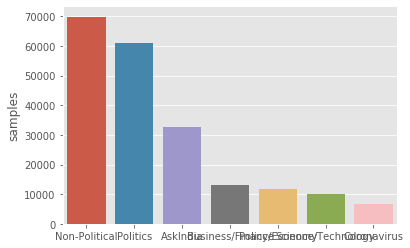

In [5]:
x=dfn.flair.value_counts()
sns.barplot(x.index,x)

plt.gca().set_ylabel('samples')

## word distribution in `title` and `selftext` of each flair

(7,)


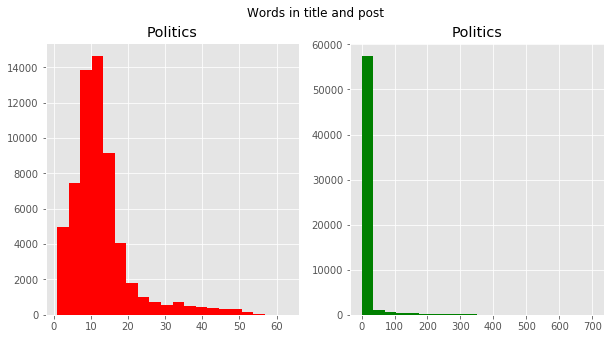

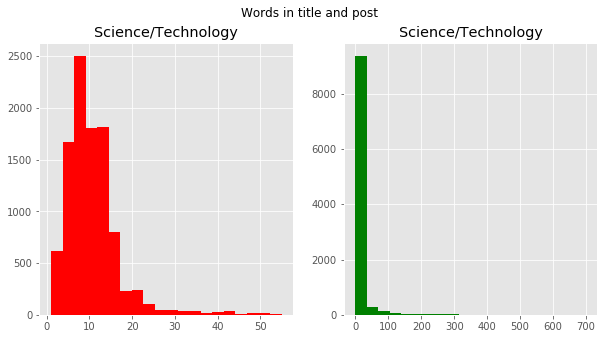

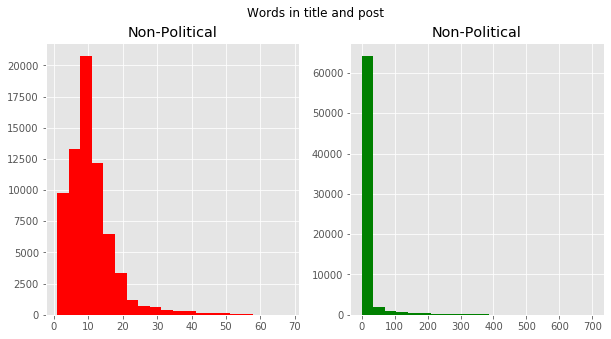

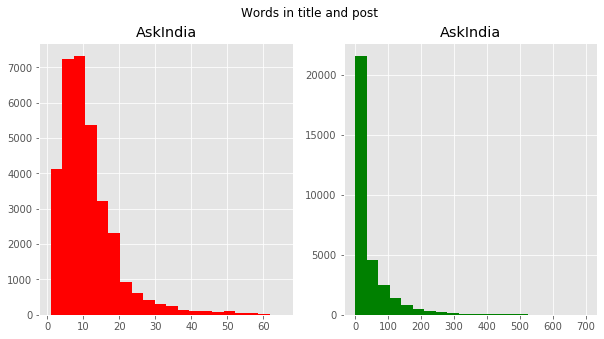

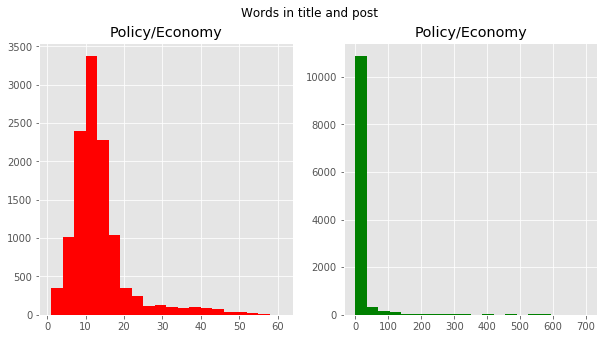

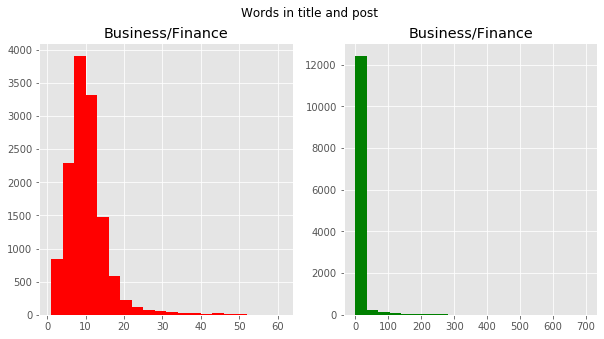

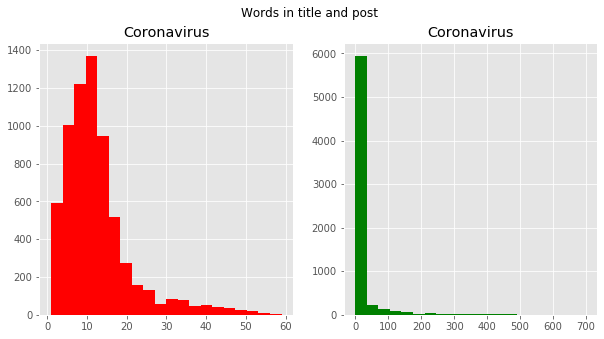

In [6]:
dfn=dfn.fillna("")
unique=dfn.flair.unique()
print(unique.shape)
for i in unique:
    
    
    fig,(ax1,ax2)=plt.subplots(1,2,figsize=(10,5))
    post_len=dfn[dfn['flair']==i]['title'].str.split().map(lambda x: len(x))
    ax1.hist(post_len,color='red',bins=20)
    ax1.set_title(str(i))

    post_text_len=dfn[dfn['flair']==i]['selftext'].str.split().map(lambda p: len(p))
    ax2.hist(post_text_len,color='green', bins=20, range=(0,700))
    ax2.set_title(str(i))
    fig.suptitle('Words in title and post')
    plt.show()


In [12]:
dfn['selftext'].value_counts()

## Replacing these noisy selftext values with a space

In [13]:
dfn.selftext=dfn.selftext.replace(['[removed]', '[deleted]', 'Nan', '\[removed\]'], '')

In [14]:
dfn['selftext'].value_counts()

## We have a lot of rows with `selftext` empty, this can suggest that using only title for classification can be a good approach

In [17]:
print ((dfn['selftext'] == "").sum())

170832


In [37]:
from wordcloud import STOPWORDS
from collections import defaultdict

def generate_ngrams(text, n_gram=1):
    token = [token for token in text.lower().split(' ') if token != '' if token not in STOPWORDS]
    ngrams = zip(*[token[i:] for i in range(n_gram)])
    return [' '.join(ngram) for ngram in ngrams]

N = 100

# Unigrams
title_unigrams = defaultdict(int)
selftext_unigrams = defaultdict(int)

for t in dfn['title']:
    for word in generate_ngrams(t):
        title_unigrams[word] += 1
        
for t in dfn['selftext']:
    for word in generate_ngrams(t):
        selftext_unigrams[word] += 1
        
df_title_unigrams = pd.DataFrame(sorted(title_unigrams.items(), key=lambda x: x[1])[::-1])
df_selftext_unigrams = pd.DataFrame(sorted(selftext_unigrams.items(), key=lambda x: x[1])[::-1])

# Bigrams
title_bigrams = defaultdict(int)
selftext_bigrams = defaultdict(int)

for t in dfn['title']:
    for word in generate_ngrams(t, n_gram=2):
        title_bigrams[word] += 1
        
for tweet in dfn['selftext']:
    for word in generate_ngrams(t, n_gram=2):
        selftext_bigrams[word] += 1
        
df_title_bigrams = pd.DataFrame(sorted(title_bigrams.items(), key=lambda x: x[1])[::-1])
df_selftext_bigrams = pd.DataFrame(sorted(selftext_bigrams.items(), key=lambda x: x[1])[::-1])

# Trigrams
title_trigrams = defaultdict(int)
selftext_trigrams = defaultdict(int)

for t in dfn['title']:
    for word in generate_ngrams(t, n_gram=3):
        title_trigrams[word] += 1
        
for t in dfn['selftext']:
    for word in generate_ngrams(t, n_gram=3):
        selftext_trigrams[word] += 1
        
df_title_trigrams = pd.DataFrame(sorted(title_trigrams.items(), key=lambda x: x[1])[::-1])
df_selftext_trigrams = pd.DataFrame(sorted(selftext_trigrams.items(), key=lambda x: x[1])[::-1])

/home/utsav/.local/lib/python3.6/site-packages/matplotlib/backends/backend_agg.py:211: RuntimeWarning:

Glyph 13 missing from current font.

/home/utsav/.local/lib/python3.6/site-packages/matplotlib/backends/backend_agg.py:180: RuntimeWarning:

Glyph 13 missing from current font.



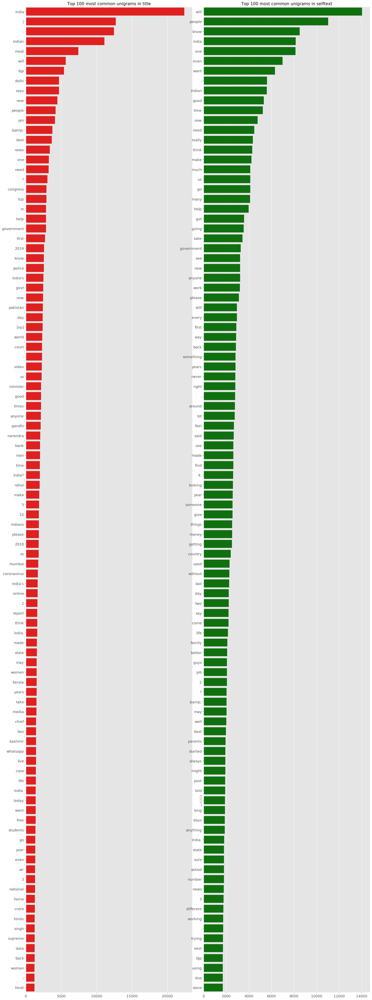

In [38]:
fig, axes = plt.subplots(ncols=2, figsize=(18, 50), dpi=100)
plt.tight_layout()

sns.barplot(y=df_title_unigrams[0].values[:N], x=df_title_unigrams[1].values[:N], ax=axes[0], color='red')
sns.barplot(y=df_selftext_unigrams[0].values[:N], x=df_selftext_unigrams[1].values[:N], ax=axes[1], color='green')

for i in range(2):
    axes[i].spines['right'].set_visible(False)
    axes[i].set_xlabel('')
    axes[i].set_ylabel('')
    axes[i].tick_params(axis='x', labelsize=13)
    axes[i].tick_params(axis='y', labelsize=13)

axes[0].set_title(f'Top {N} most common unigrams in title', fontsize=15)
axes[1].set_title(f'Top {N} most common unigrams in selftext', fontsize=15)

plt.show()

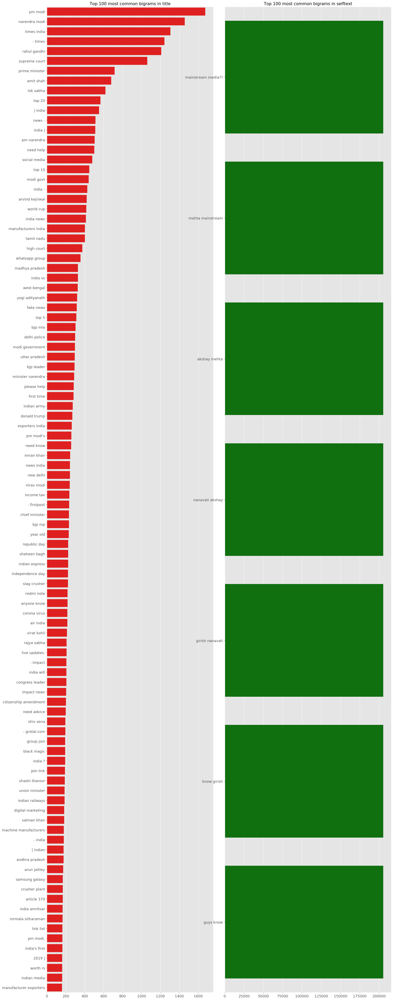

In [41]:
fig, axes = plt.subplots(ncols=2, figsize=(18, 50), dpi=100)
plt.tight_layout()

sns.barplot(y=df_title_bigrams[0].values[:N], x=df_title_bigrams[1].values[:N], ax=axes[0], color='red')
sns.barplot(y=df_selftext_bigrams[0].values[:N], x=df_selftext_bigrams[1].values[:N], ax=axes[1], color='green')

for i in range(2):
    axes[i].spines['right'].set_visible(False)
    axes[i].set_xlabel('')
    axes[i].set_ylabel('')
    axes[i].tick_params(axis='x', labelsize=13)
    axes[i].tick_params(axis='y', labelsize=13)

axes[0].set_title(f'Top {N} most common bigrams in title', fontsize=15)
axes[1].set_title(f'Top {N} most common bigrams in selftext', fontsize=15)

plt.show()

/home/utsav/.local/lib/python3.6/site-packages/matplotlib/backends/backend_agg.py:211: RuntimeWarning:

Glyph 2346 missing from current font.

/home/utsav/.local/lib/python3.6/site-packages/matplotlib/backends/backend_agg.py:211: RuntimeWarning:

Glyph 2381 missing from current font.

/home/utsav/.local/lib/python3.6/site-packages/matplotlib/backends/backend_agg.py:211: RuntimeWarning:

Glyph 2352 missing from current font.

/home/utsav/.local/lib/python3.6/site-packages/matplotlib/backends/backend_agg.py:211: RuntimeWarning:

Glyph 2366 missing from current font.

/home/utsav/.local/lib/python3.6/site-packages/matplotlib/backends/backend_agg.py:211: RuntimeWarning:

Glyph 2341 missing from current font.

/home/utsav/.local/lib/python3.6/site-packages/matplotlib/backends/backend_agg.py:211: RuntimeWarning:

Glyph 2350 missing from current font.

/home/utsav/.local/lib/python3.6/site-packages/matplotlib/backends/backend_agg.py:211: RuntimeWarning:

Glyph 2367 missing from current font.


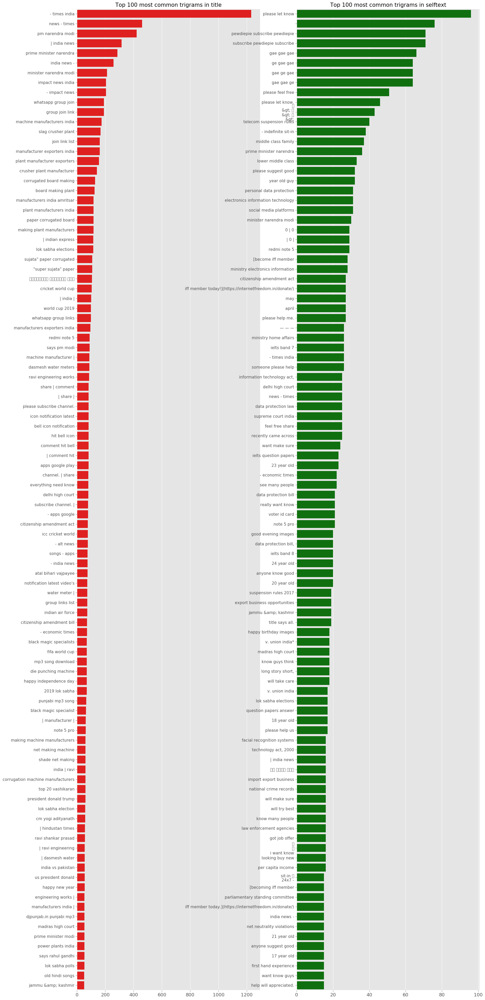

In [40]:
fig, axes = plt.subplots(ncols=2, figsize=(20, 50), dpi=100)

sns.barplot(y=df_title_trigrams[0].values[:N], x=df_title_trigrams[1].values[:N], ax=axes[0], color='red')
sns.barplot(y=df_selftext_trigrams[0].values[:N], x=df_selftext_trigrams[1].values[:N], ax=axes[1], color='green')

for i in range(2):
    axes[i].spines['right'].set_visible(False)
    axes[i].set_xlabel('')
    axes[i].set_ylabel('')
    axes[i].tick_params(axis='x', labelsize=13)
    axes[i].tick_params(axis='y', labelsize=11)

axes[0].set_title(f'Top {N} most common trigrams in title', fontsize=15)
axes[1].set_title(f'Top {N} most common trigrams in selftext', fontsize=15)

plt.show()

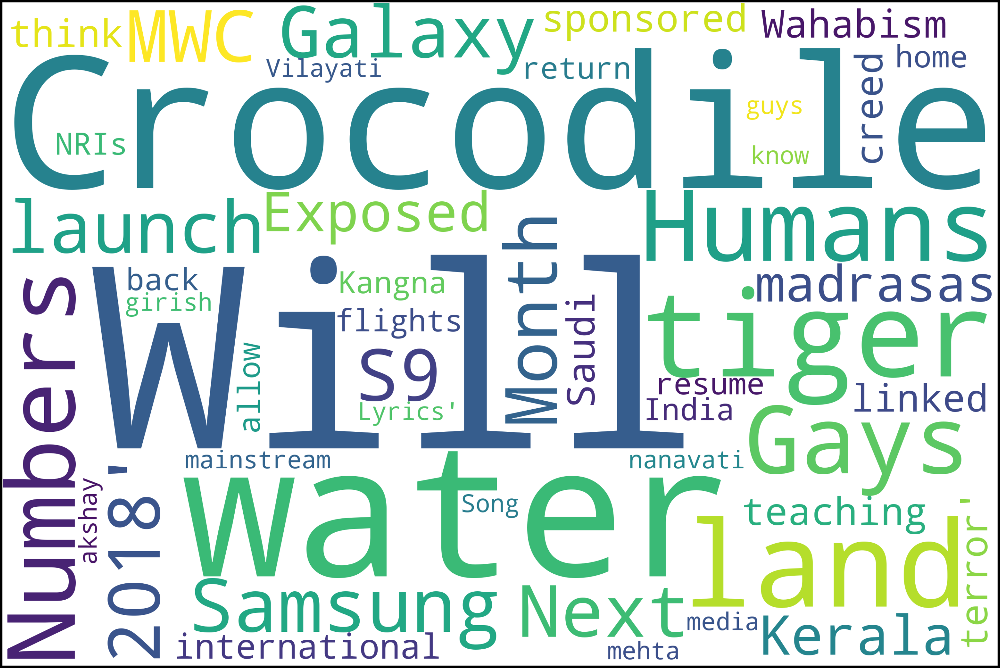

In [43]:
from wordcloud import WordCloud
text = dfn.title.values
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'white',
    stopwords = STOPWORDS).generate(str(text))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [71]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

def wc(i):
    dfw=dfn[dfn['flair']==i]
    text = dfw.title.values
    wordcloud = WordCloud(
        width = 3000,
        height = 2000,
        background_color = 'white',
        stopwords = STOPWORDS).generate(str(text))
    fig = plt.figure(
        figsize = (40, 30),
        facecolor = 'k',
        edgecolor = 'k')
    plt.imshow(wordcloud, interpolation = 'bilinear')
    plt.axis('off')
    plt.tight_layout(pad=0)
    plt.show()

word cloud for Politics


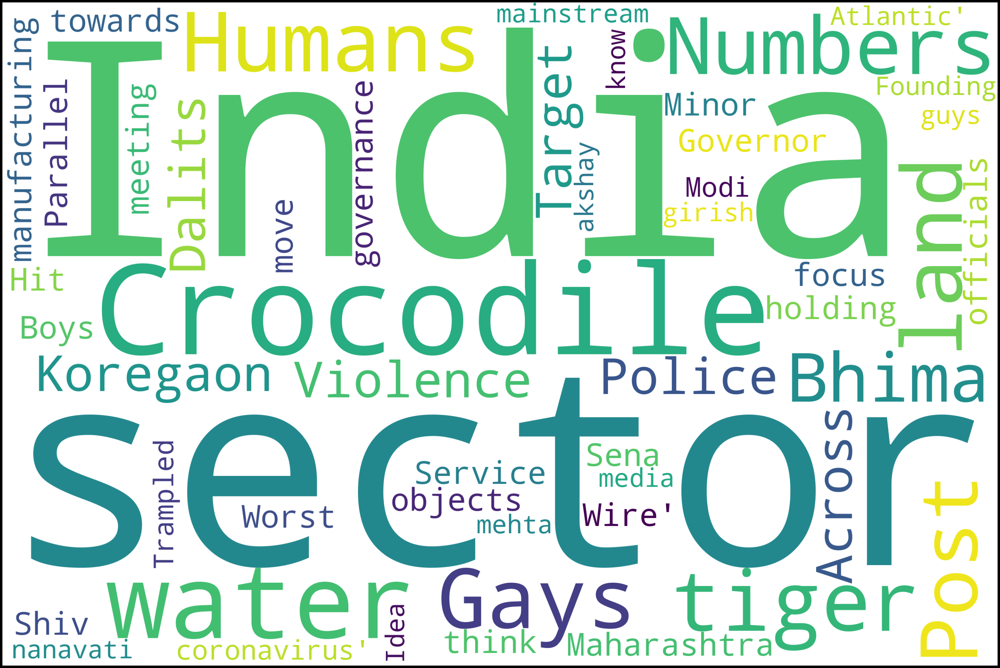

word cloud for Science/Technology


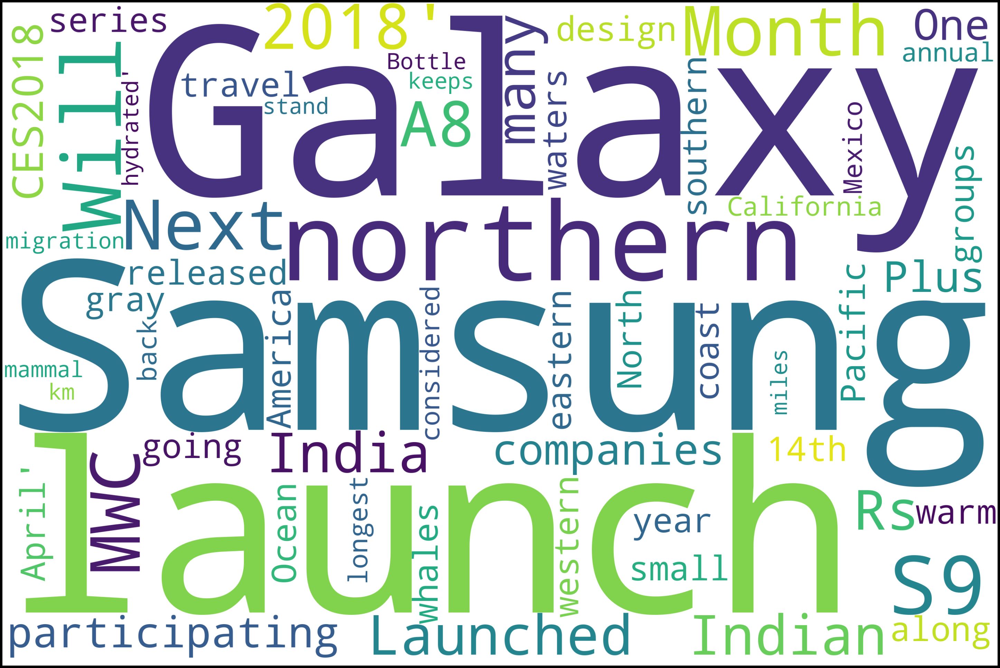

word cloud for Non-Political


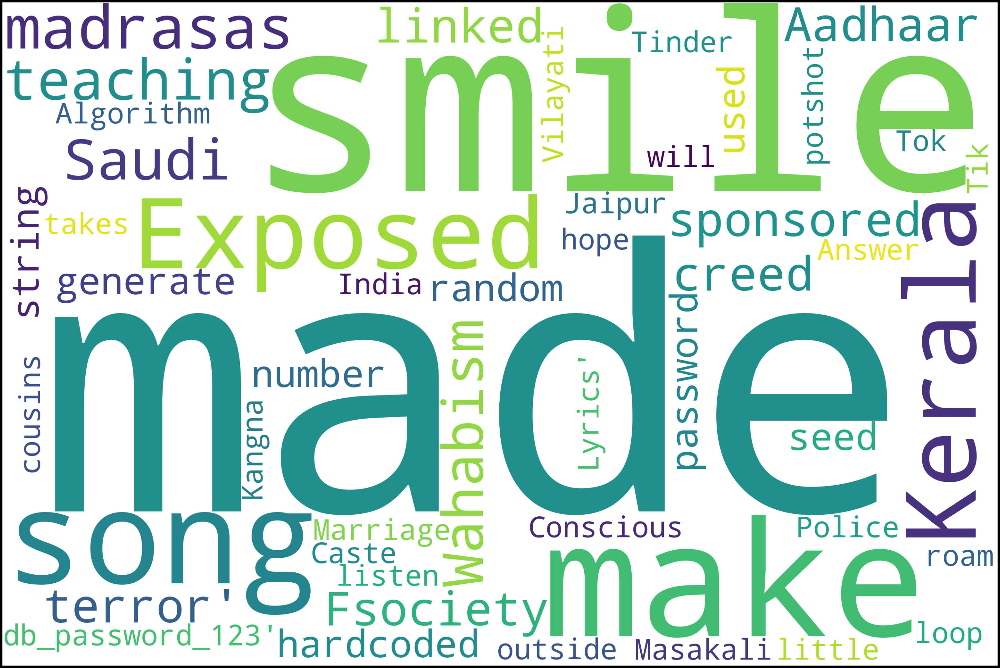

word cloud for AskIndia


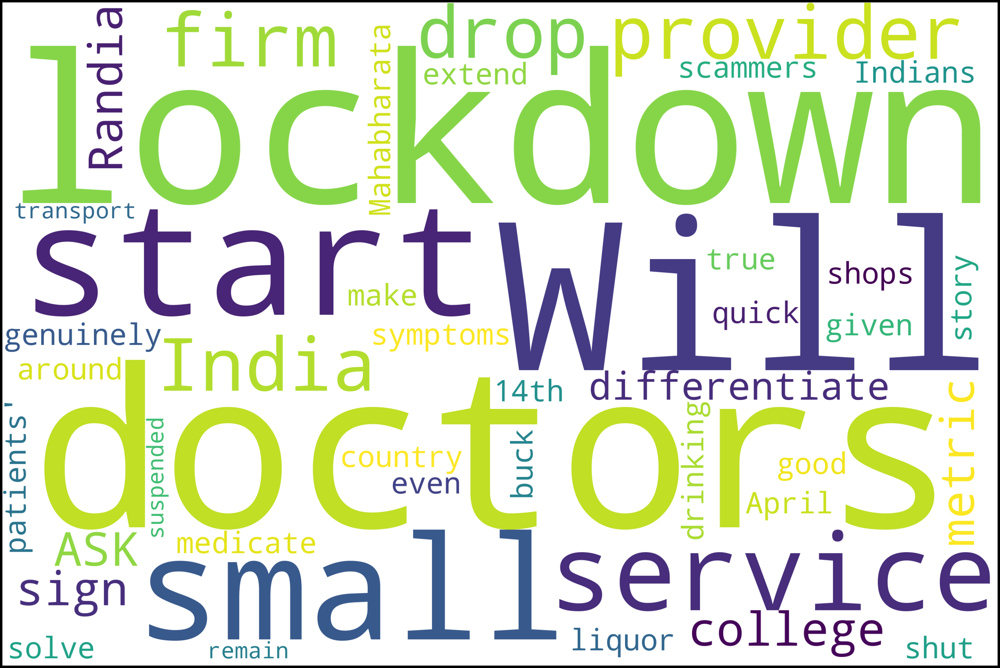

word cloud for Policy/Economy


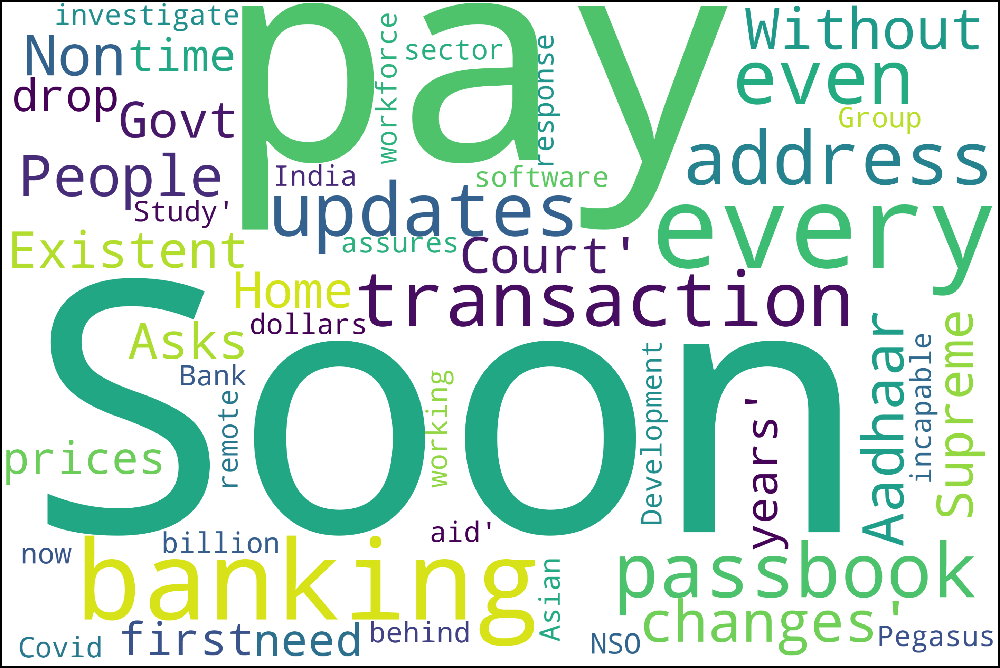

word cloud for Business/Finance


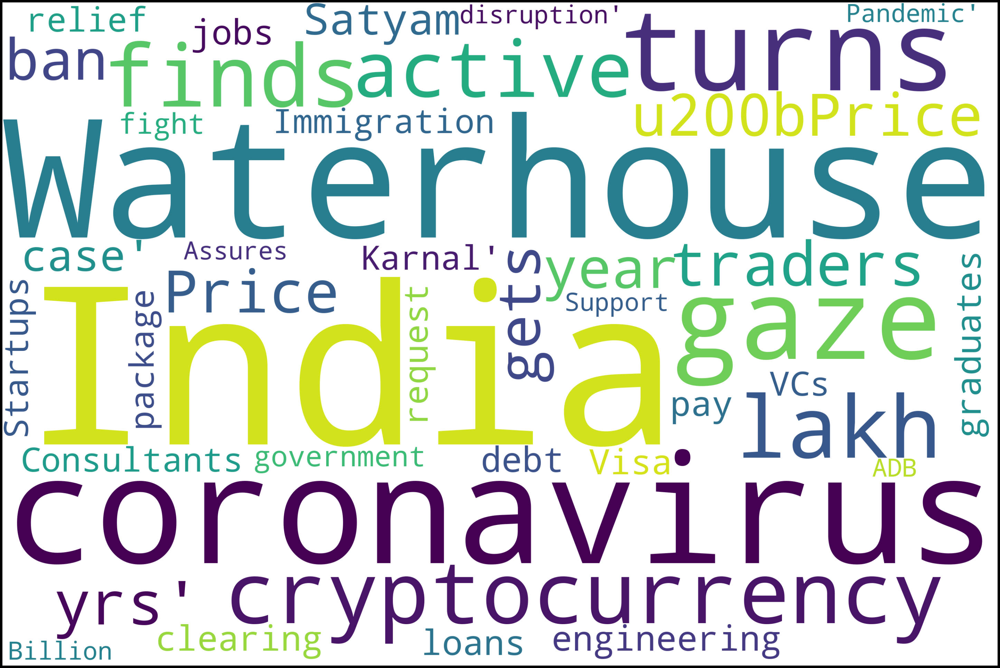

word cloud for Coronavirus


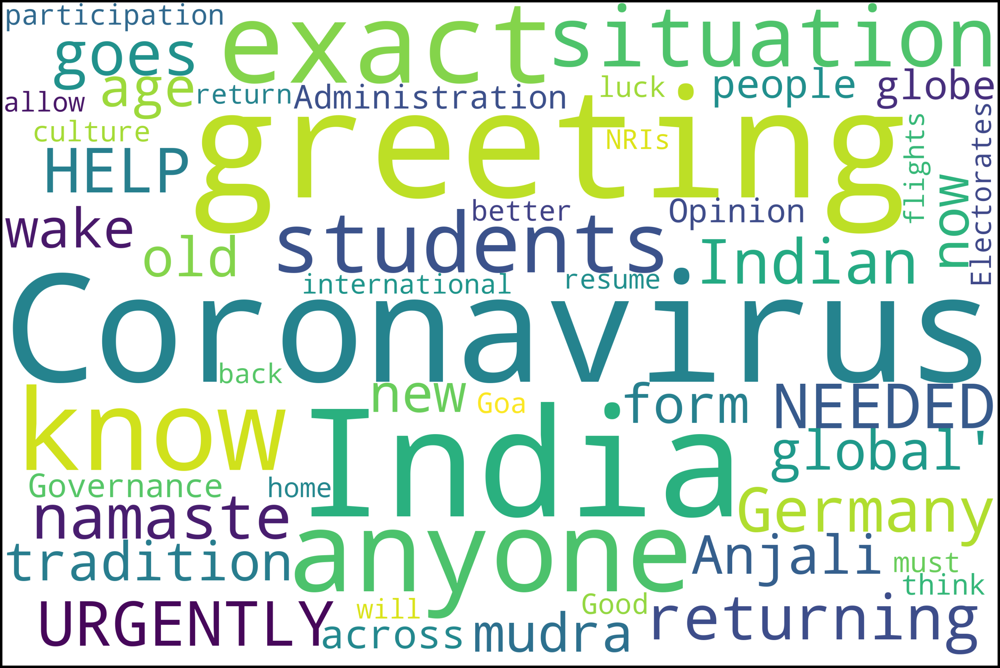

In [72]:
for i in unique:
    print ('word cloud for '+i)
    wc(i)

## Most active Users

In [79]:
dfn['author'].value_counts().head(30)

[deleted]             3477
modi-modi-modi        1850
manoj_pnchal          1779
sudden_dust           1594
Ajaatshatru34         1373
GL4389                1256
ppatra                1245
Web-Design-Seo        1042
Sensitive_File        1029
thewebdev              758
sIlentr3b3l            719
pramodc84              694
ritaarora222           688
hipporama              679
iali307                598
bliss_tree             570
Gavthi_Batman          564
DailyAddaaDesk         558
pannagasamir           532
Neglectedsince1994     520
in3po                  498
darklordind            451
GlobalCitizen12345     445
pitchwin               422
Kalgudi                417
Ritiriwaz              406
iamfawad               404
madamplease            399
shadilal_gharjode      379
shellysharma01         379
Name: author, dtype: int64

## Most Viral submissions
Most of the submissions in reddit go unnotices, we'll focus on posts that drew some engagements

In [83]:
dfn['score'].describe()

count    205363.000000
mean         20.503990
std         126.714914
min           0.000000
25%           1.000000
50%           1.000000
75%           5.000000
max       13494.000000
Name: score, dtype: float64

In [97]:
df_viral=dfn[dfn.score >= 10]
df_viral.sort('score', ascending=False)

/home/utsav/.local/lib/python3.6/site-packages/ipykernel_launcher.py:2: FutureWarning:

sort(columns=....) is deprecated, use sort_values(by=.....)



,Unnamed: 0,sub_id,title,url,author,score,numComms,permalink,flair,stickied,pinned,over_18,selftext,spoiler,num_crossposts,is_video,Year,dummy_calc,day,title_bigrams
149823,329278,dgbd6i,"I found this newspaper cutting from 18 Nov, 20...",https://i.redd.it/9jnllzn21vr31.jpg,nvi14,13494,1202,/r/india/comments/dgbd6i/i_found_this_newspape...,Non-Political,False,False,False,,False,0,False,2019,1,11,"[(I, found), (found, this), (this, newspaper),..."
61060,120765,9dt64s,"If you are not moved by this picture, I wish I...",https://pbs.twimg.com/media/Dmb1s-rV4AAZdBX.jpg,Whatay,10487,389,/r/india/comments/9dt64s/if_you_are_not_moved_...,Non-Political,False,False,False,,False,16,False,2018,1,7,"[(If, you), (you, are), (are, not), (not, move..."
98451,210552,avafxp,Megathread: India-Pakistan border skirmish,https://www.reddit.com/r/india/comments/avafxp...,doc_two_thirty,10158,7743,/r/india/comments/avafxp/megathread_indiapakis...,Politics,False,False,False,There is a lot of news and speculation coming ...,False,0,False,2019,1,27,"[(Megathread:, India-Pakistan), (India-Pakista..."
44535,86287,8uzewx,This is India.,https://i.redd.it/jz8hn64ff2711.jpg,Lowcrbnaman,8812,319,/r/india/comments/8uzewx/this_is_india/,Politics,False,False,False,,False,3,False,2018,1,30,"[(This, is), (is, India.)]"
148845,326847,ddziqc,Spend nearly 500 rs bucks to watch JOKER and i...,https://i.redd.it/up62gtt86vq31.jpg,vijju9,8490,933,/r/india/comments/ddziqc/spend_nearly_500_rs_b...,Policy/Economy,False,False,False,,False,0,False,2019,1,6,"[(Spend, nearly), (nearly, 500), (500, rs), (r..."
143697,315196,d338y1,Ganesh Chaturthi &amp; Muharram possessions cr...,https://i.redd.it/bbydeqasl3m31.jpg,iSubhi2012,7435,369,/r/india/comments/d338y1/ganesh_chaturthi_muha...,Non-Political,False,False,False,,False,0,False,2019,1,12,"[(Ganesh, Chaturthi), (Chaturthi, &amp;), (&am..."
106742,229555,b7jxcs,Incredible India.,https://i.redd.it/husuyl81udp21.jpg,Lowcrbnaman,6842,528,/r/india/comments/b7jxcs/incredible_india/,Non-Political,False,False,False,,False,0,False,2019,1,31,"[(Incredible, India.)]"
29682,52921,8d4o4q,500TB pen drive from Mahabharata era unearthed...,https://i.redd.it/a4wfh828cns01.jpg,notsocourageous,5591,252,/r/india/comments/8d4o4q/500tb_pen_drive_from_...,Non-Political,False,False,False,,False,4,False,2018,1,18,"[(500TB, pen), (pen, drive), (drive, from), (f..."
134320,292397,cihfjd,"I feel ashamed to call myself a Mumbaikar, a t...",https://v.redd.it/0box4i02kuc31,_Floydian,5435,639,/r/india/comments/cihfjd/i_feel_ashamed_to_cal...,Non-Political,False,False,False,,False,0,True,2019,1,27,"[(I, feel), (feel, ashamed), (ashamed, to), (t..."
98785,211303,avmdjz,#Profile4Peace #SayNoToWar (x-post from /r/pics),https://i.redd.it/the9e1rtq5j21.jpg,UUUU__UUUU,5009,349,/r/india/comments/avmdjz/profile4peace_saynoto...,Politics,False,False,False,,False,0,False,2019,1,28,"[(#Profile4Peace, #SayNoToWar), (#SayNoToWar, ..."


In [91]:
df_viral.flair.value_counts()

Non-Political         14980
Politics              14556
AskIndia               5450
Policy/Economy         3237
Science/Technology     1215
Business/Finance       1165
Coronavirus              70
Name: flair, dtype: int64

In [92]:
df_viral.author.value_counts().head(30)

ppatra                520
GL4389                492
sudden_dust           459
sIlentr3b3l           456
Ajaatshatru34         338
thewebdev             314
hipporama             307
in3po                 258
darklordind           237
pramodc84             230
pitchwin              217
bliss_tree            214
pannagasamir          212
madamplease           202
Main_Hu_Doga          200
Gavthi_Batman         169
[deleted]             168
shadilal_gharjode     163
gcs8                  159
_RandomRedditor       159
Bapu_Ji               152
harddisc              135
GlobalCitizen12345    132
FactCheckPolice       130
whtisthis             129
IAmMohit              127
ponniyin_selvan       125
shhhhhhhhhh           122
I_call_it             116
_Floydian             112
Name: author, dtype: int64

## We can see some of the viral posts are stickied

In [103]:
df_viral[df_viral.stickied == True]

,Unnamed: 0,sub_id,title,url,author,score,numComms,permalink,flair,stickied,pinned,over_18,selftext,spoiler,num_crossposts,is_video,Year,dummy_calc,day,title_bigrams
6459,11540,7uga6a,Union Budget 2018 - Consolidate all informatio...,https://www.reddit.com/r/india/comments/7uga6a...,root_su,110,807,/r/india/comments/7uga6a/union_budget_2018_con...,Politics,True,False,False,"\r\nLots of news, information, and discussion...",False,2,False,2018,1,1,"[(Union, Budget), (Budget, 2018), (2018, -), (..."
13235,23525,7zum0q,Tata Sky logging server AKA Sad state of infor...,https://www.reddit.com/r/india/comments/7zum0q...,always_say_this,255,79,/r/india/comments/7zum0q/tata_sky_logging_serv...,Non-Political,True,False,False,"Hello,\r\n\r\nI am the guy who found out the t...",False,0,False,2018,1,24,"[(Tata, Sky), (Sky, logging), (logging, server..."
15007,26697,81asx2,meirholi,https://i.imgur.com/ITxHm1u.jpg,Corvokillsalot,357,31,/r/india/comments/81asx2/meirholi/,Non-Political,True,False,False,,False,0,False,2018,1,2,[]
23860,43144,88qc37,April Fools Thread,https://www.reddit.com/r/india/comments/88qc37...,saptarsi,53,245,/r/india/comments/88qc37/april_fools_thread/,Non-Political,True,False,False,Go nuts!,False,0,False,2018,1,1,"[(April, Fools), (Fools, Thread)]"
26088,46939,8anyte,CWG 2018 Megathread,https://www.reddit.com/r/india/comments/8anyte...,saptarsi,156,79,/r/india/comments/8anyte/cwg_2018_megathread/,Non-Political,True,False,False,"Discuss results. Post highlights, gifs, images...",False,0,False,2018,1,8,"[(CWG, 2018), (2018, Megathread)]"
197828,407131,fpf9mr,India on Lockdown - State Wise Update Thread,https://www.reddit.com/r/india/comments/fpf9mr...,Neglectedsince1994,15,63,/r/india/comments/fpf9mr/india_on_lockdown_sta...,Coronavirus,True,False,False,***⚠️***[***Union Ministry of Home Affairs gui...,False,0,False,2020,1,26,"[(India, on), (on, Lockdown), (Lockdown, -), (..."


In [104]:
dfn['numComms'].describe()

count    205363.000000
mean          8.837751
std          48.831193
min           0.000000
25%           0.000000
50%           1.000000
75%           6.000000
max       11706.000000
Name: numComms, dtype: float64

In [105]:
df_viral_comms=dfn[dfn.numComms >= 10]
df_viral_comms.sort('numComms', ascending=False)

/home/utsav/.local/lib/python3.6/site-packages/ipykernel_launcher.py:2: FutureWarning:

sort(columns=....) is deprecated, use sort_values(by=.....)



,Unnamed: 0,sub_id,title,url,author,score,numComms,permalink,flair,stickied,pinned,over_18,selftext,spoiler,num_crossposts,is_video,Year,dummy_calc,day,title_bigrams
193393,401558,fkttm7,Coronavirus (COVID-19) Megathread - News and U...,https://www.reddit.com/r/india/comments/fkttm7...,IAmMohit,3,11706,/r/india/comments/fkttm7/coronavirus_covid19_m...,Coronavirus,True,False,False,**Central thread for sharing coronavirus News ...,False,0,False,2020,1,18,"[(Coronavirus, (COVID-19)), ((COVID-19), Megat..."
198940,408503,fqqdsg,Coronavirus (COVID-19) Megathread - News and U...,https://www.reddit.com/r/india/comments/fqqdsg...,IAmMohit,5,11630,/r/india/comments/fqqdsg/coronavirus_covid19_m...,Coronavirus,True,False,False,**Central thread for sharing coronavirus News ...,False,0,False,2020,1,29,"[(Coronavirus, (COVID-19)), ((COVID-19), Megat..."
98451,210552,avafxp,Megathread: India-Pakistan border skirmish,https://www.reddit.com/r/india/comments/avafxp...,doc_two_thirty,10158,7743,/r/india/comments/avafxp/megathread_indiapakis...,Politics,False,False,False,There is a lot of news and speculation coming ...,False,0,False,2019,1,27,"[(Megathread:, India-Pakistan), (India-Pakista..."
196563,405562,fo661m,"""From midnight the entire country will go unde...",https://twitter.com/TheQuint/status/1242460593...,Neglectedsince1994,1,1536,/r/india/comments/fo661m/from_midnight_the_ent...,Politics,False,False,False,,False,0,False,2020,1,24,"[(""From, midnight), (midnight, the), (the, ent..."
98048,209658,auu8yl,IAF Sources: 12 Mirage 2000 jets took part in ...,https://twitter.com/ANI/status/110023050971049...,Parsainama,4366,1498,/r/india/comments/auu8yl/iaf_sources_12_mirage...,Politics,False,False,False,,False,0,False,2019,1,26,"[(IAF, Sources:), (Sources:, 12), (12, Mirage)..."
68416,138370,9n6dkx,Amazon Great Indian Festival and Flipkart Big ...,https://www.reddit.com/r/india/comments/9n6dkx...,ppatra,1,1330,/r/india/comments/9n6dkx/amazon_great_indian_f...,Non-Political,False,False,False,Please comment using [Flipkart] or [Amazon] at...,False,0,False,2018,1,11,"[(Amazon, Great), (Great, Indian), (Indian, Fe..."
149823,329278,dgbd6i,"I found this newspaper cutting from 18 Nov, 20...",https://i.redd.it/9jnllzn21vr31.jpg,nvi14,13494,1202,/r/india/comments/dgbd6i/i_found_this_newspape...,Non-Political,False,False,False,,False,0,False,2019,1,11,"[(I, found), (found, this), (this, newspaper),..."
193647,401856,fl998t,PM Modi to address the nation | Discussion Thr...,https://www.reddit.com/r/india/comments/fl998t...,Devam13,1,1197,/r/india/comments/fl998t/pm_modi_to_address_th...,Politics,False,False,False,PM Modi to address the nation tonight somethin...,False,0,False,2020,1,19,"[(PM, Modi), (Modi, to), (to, address), (addre..."
131744,286425,cd5vx0,Amazon Prime Day deals : 15th &amp; 16th July,https://www.reddit.com/r/india/comments/cd5vx0...,achordiy,114,1063,/r/india/comments/cd5vx0/amazon_prime_day_deal...,AskIndia,False,False,False,Looking to g*rab all the best deals with Amaz...,False,0,False,2019,1,14,"[(Amazon, Prime), (Prime, Day), (Day, deals), ..."
11983,21274,7yswge,"Caste system a curse, it should end for countr...",https://economictimes.indiatimes.com/news/poli...,lovejackdaniels,1026,991,/r/india/comments/7yswge/caste_system_a_curse_...,Politics,False,False,False,,False,0,False,2018,1,20,"[(Caste, system), (system, a), (a, curse,), (c..."


In [106]:
df_viral_comms[df_viral_comms.stickied == True]

,Unnamed: 0,sub_id,title,url,author,score,numComms,permalink,flair,stickied,pinned,over_18,selftext,spoiler,num_crossposts,is_video,Year,dummy_calc,day,title_bigrams
6459,11540,7uga6a,Union Budget 2018 - Consolidate all informatio...,https://www.reddit.com/r/india/comments/7uga6a...,root_su,110,807,/r/india/comments/7uga6a/union_budget_2018_con...,Politics,True,False,False,"\r\nLots of news, information, and discussion...",False,2,False,2018,1,1,"[(Union, Budget), (Budget, 2018), (2018, -), (..."
13235,23525,7zum0q,Tata Sky logging server AKA Sad state of infor...,https://www.reddit.com/r/india/comments/7zum0q...,always_say_this,255,79,/r/india/comments/7zum0q/tata_sky_logging_serv...,Non-Political,True,False,False,"Hello,\r\n\r\nI am the guy who found out the t...",False,0,False,2018,1,24,"[(Tata, Sky), (Sky, logging), (logging, server..."
15007,26697,81asx2,meirholi,https://i.imgur.com/ITxHm1u.jpg,Corvokillsalot,357,31,/r/india/comments/81asx2/meirholi/,Non-Political,True,False,False,,False,0,False,2018,1,2,[]
23860,43144,88qc37,April Fools Thread,https://www.reddit.com/r/india/comments/88qc37...,saptarsi,53,245,/r/india/comments/88qc37/april_fools_thread/,Non-Political,True,False,False,Go nuts!,False,0,False,2018,1,1,"[(April, Fools), (Fools, Thread)]"
26088,46939,8anyte,CWG 2018 Megathread,https://www.reddit.com/r/india/comments/8anyte...,saptarsi,156,79,/r/india/comments/8anyte/cwg_2018_megathread/,Non-Political,True,False,False,"Discuss results. Post highlights, gifs, images...",False,0,False,2018,1,8,"[(CWG, 2018), (2018, Megathread)]"
193393,401558,fkttm7,Coronavirus (COVID-19) Megathread - News and U...,https://www.reddit.com/r/india/comments/fkttm7...,IAmMohit,3,11706,/r/india/comments/fkttm7/coronavirus_covid19_m...,Coronavirus,True,False,False,**Central thread for sharing coronavirus News ...,False,0,False,2020,1,18,"[(Coronavirus, (COVID-19)), ((COVID-19), Megat..."
197828,407131,fpf9mr,India on Lockdown - State Wise Update Thread,https://www.reddit.com/r/india/comments/fpf9mr...,Neglectedsince1994,15,63,/r/india/comments/fpf9mr/india_on_lockdown_sta...,Coronavirus,True,False,False,***⚠️***[***Union Ministry of Home Affairs gui...,False,0,False,2020,1,26,"[(India, on), (on, Lockdown), (Lockdown, -), (..."
198940,408503,fqqdsg,Coronavirus (COVID-19) Megathread - News and U...,https://www.reddit.com/r/india/comments/fqqdsg...,IAmMohit,5,11630,/r/india/comments/fqqdsg/coronavirus_covid19_m...,Coronavirus,True,False,False,**Central thread for sharing coronavirus News ...,False,0,False,2020,1,29,"[(Coronavirus, (COVID-19)), ((COVID-19), Megat..."


## Only mods can make a post stickied so authors in above posts are mod and some of the most commented posts are stickied

# Conterversial submissions (in progress)

In [110]:
dfn.to_csv('reddit_with_flairs_upd.csv', index=False)